In [49]:
import sys
import os
import time 
import subprocess
import pandas as pd
import string 
from collections import defaultdict
from numpy import mean
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from IPython.display import Image
dy = '/frazer01/home/joreyna/shared_drive/CSE-280a/Assignment_3/'

## Question 1

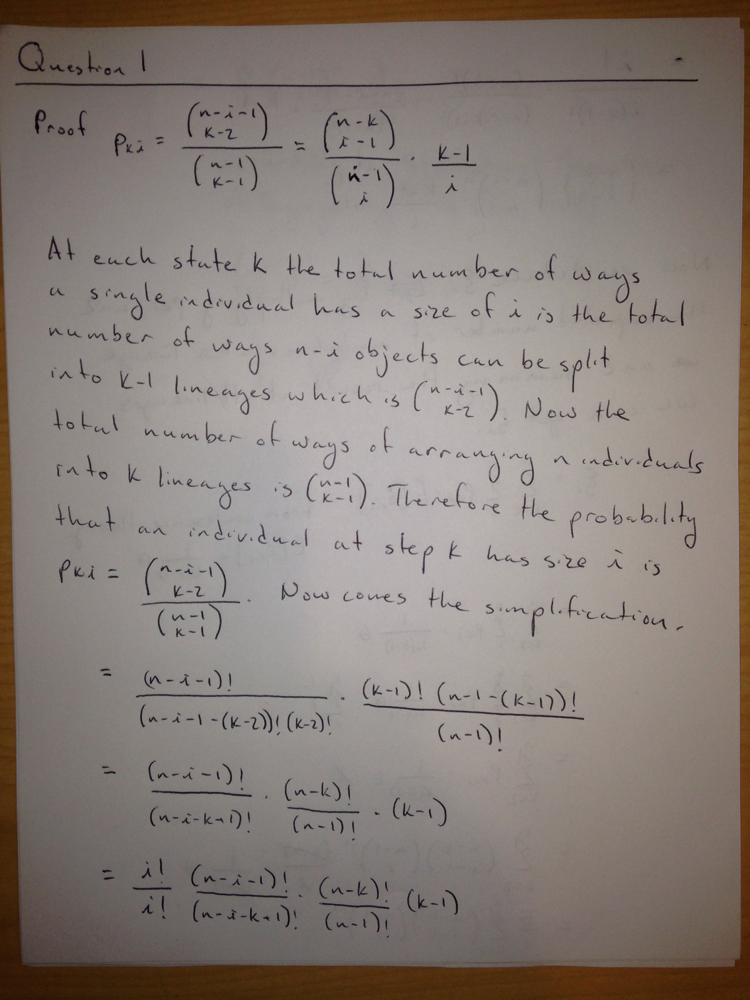

In [52]:
fn = os.path.join(dy, 'Question_1a.jpg')
Image(filename=fn)

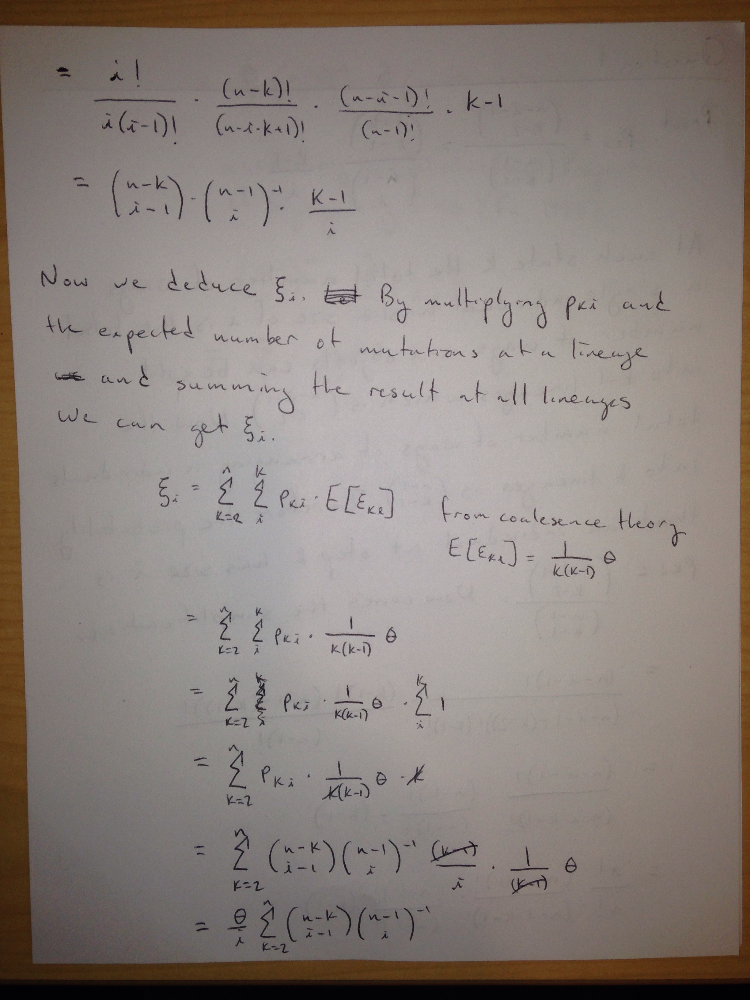

In [53]:
fn = os.path.join(dy, 'Question_1b.jpg')
Image(filename=fn)

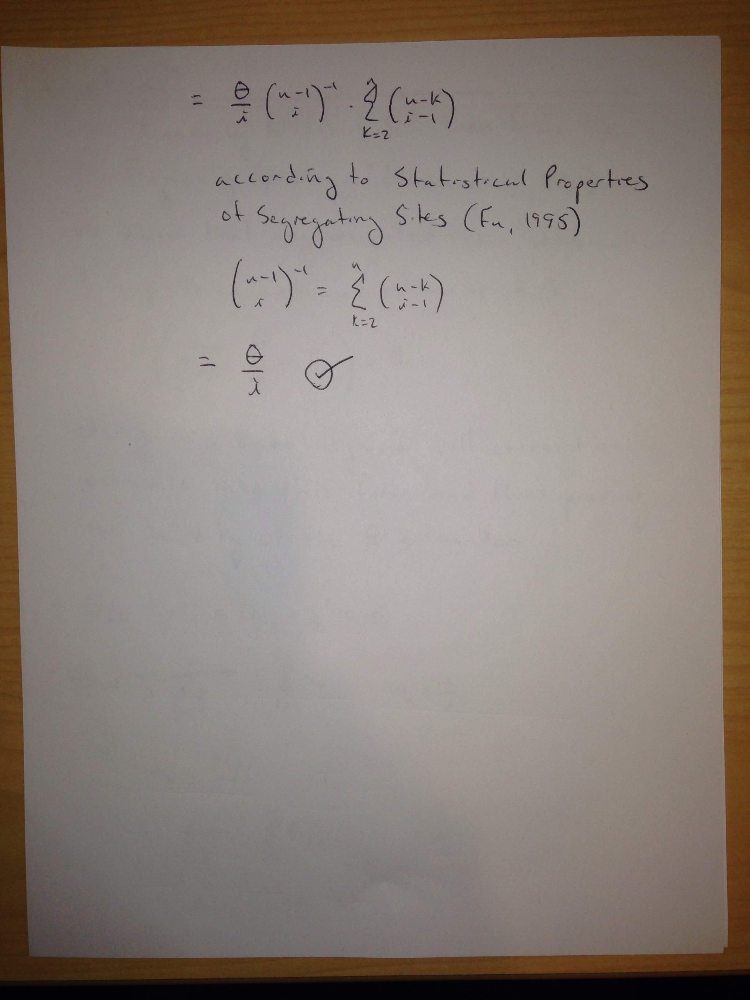

In [54]:
fn = os.path.join(dy, 'Question_1c.jpg')
Image(filename=fn)

## Question 2

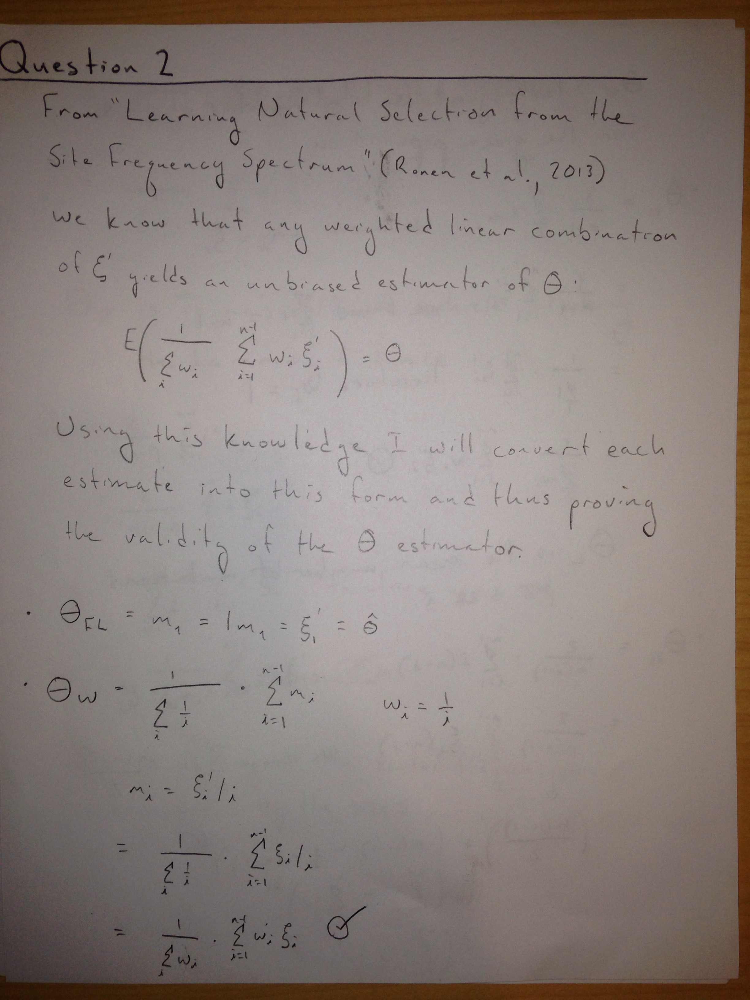

In [55]:
fn = os.path.join(dy, 'Question_2a.jpg')
Image(filename=fn)

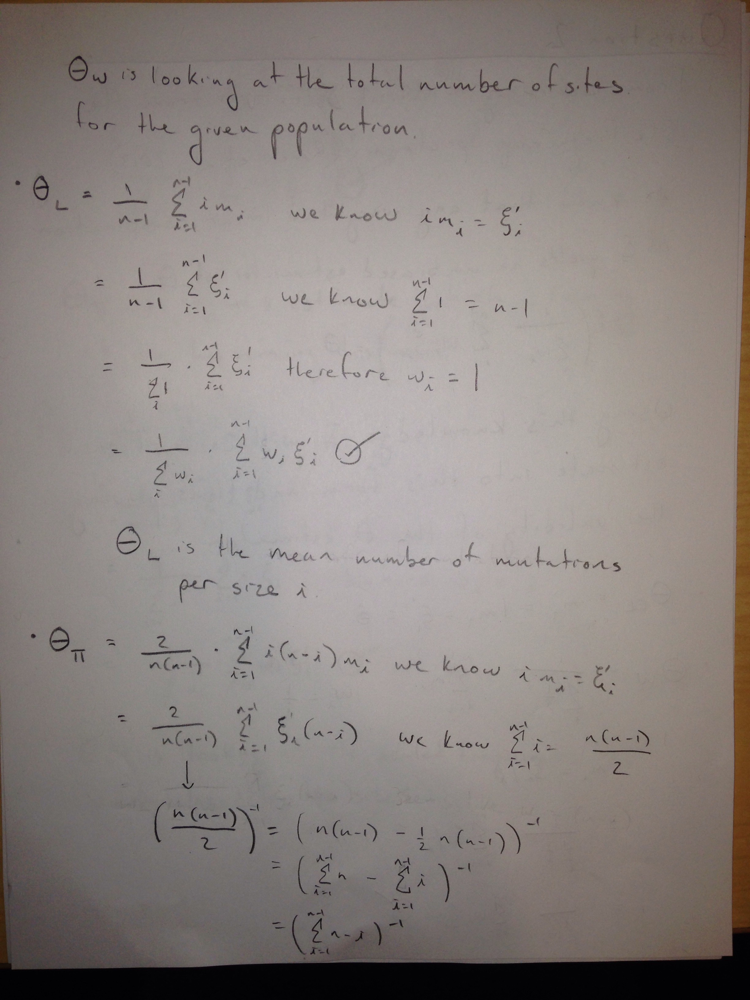

In [56]:
fn = os.path.join(dy, 'Question_2b.jpg')
Image(filename=fn)

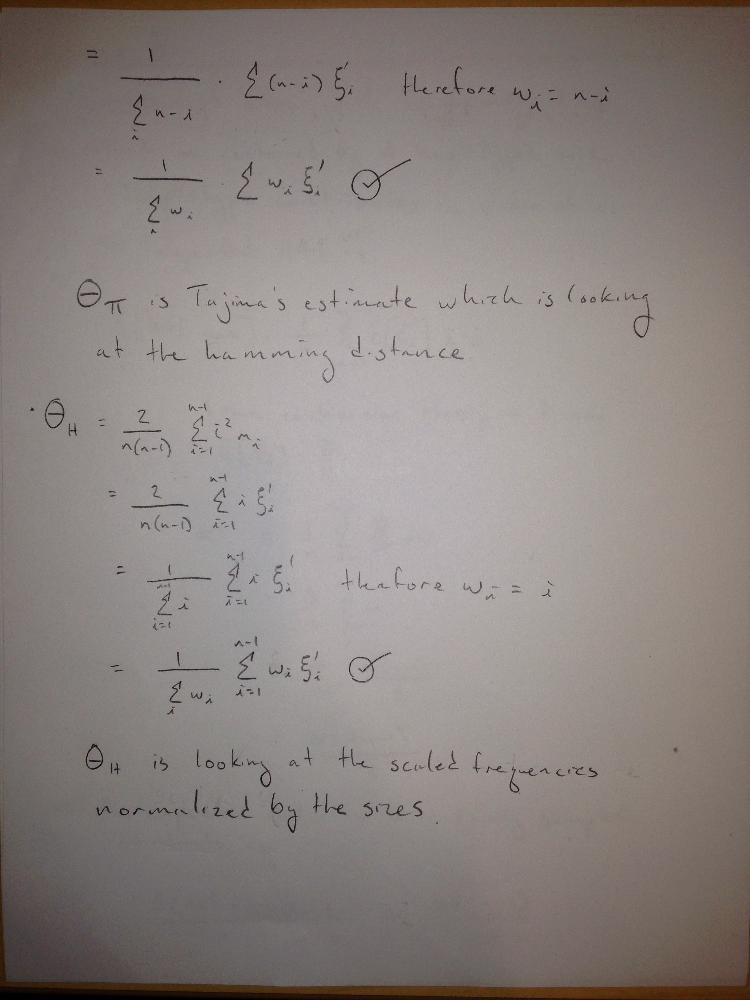

In [57]:
fn = os.path.join(dy, 'Question_2c.jpg')
Image(filename=fn)

## Question 3

#### Part (a)

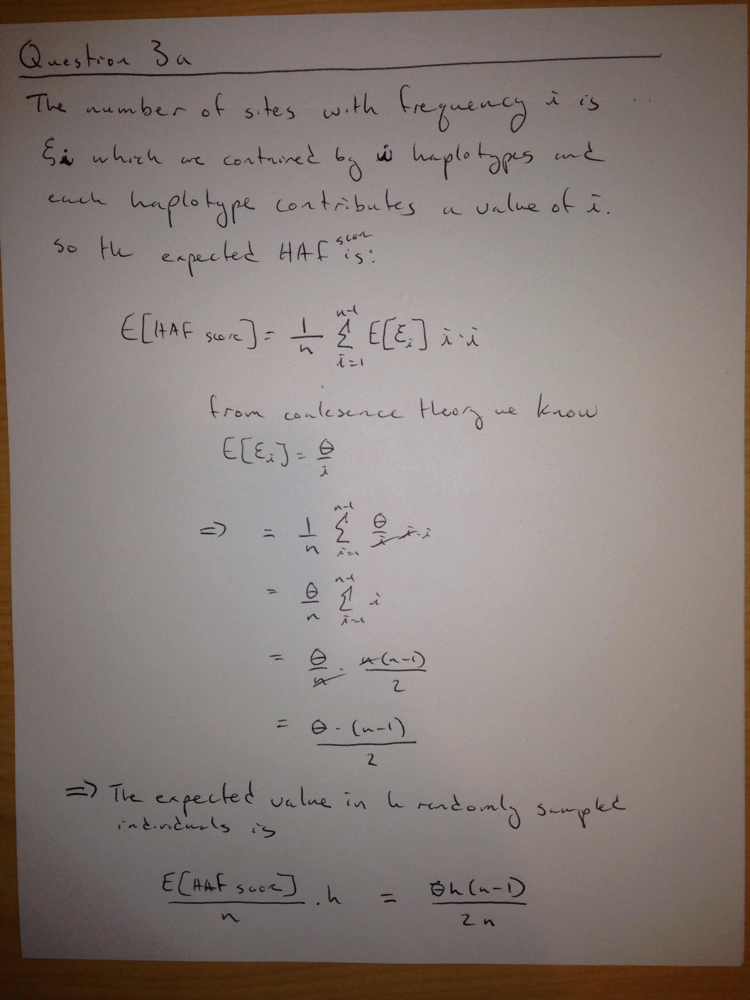

In [58]:
fn = os.path.join(dy, 'Question_3.jpg')
Image(filename=fn)

#### Part (b)

In [2]:
def str_variable(variable, name, tabs=0):
    return  '{}{}: {}'.format('\t' * tabs, name, variable)

Use msms to generate a populations growing under selection constraint. Generate many
samples (100) for each of 5 different time points since onset of selection, but plan your
simulations as it is a forward simulation, and may take some time. Use the following
parameters: N = 104, s = 0.1, θ = ρ = 250, n = 200. Use the -SI option to sample at different times since onset of selection. Your selection of sampling times should include time before fixation of the favored allele, and times after fixation. 

Plot the average of HAF scores
separately for carriers of the favored allele, and the non-carriers as a function of time since
onset of selection. The x-axis of your plot should be the time since onset of selection, while
the y-axis is the HAF-score in units of θn. What do you observe?

### Run MSMS

In [3]:
def generate_dataset(out_fn='sample.txt', population_size = 10000, \
                     s = 0.1, time = 1, favored_site = 0.50000, freq = 0.00001):
    generation = float(time) / (4 * population_size)
    sAa = 2*population_size*s
    sAA = 2 * sAa
    #     freq = float(1)/(2*population_size)
    #     freq = '{:.5f}'.format(freq)
    
    cmd = 'java -jar ' 
    cmd += '/frazer01/home/joreyna/shared_drive/CSE-280a/Assignment_2/msms/lib/msms.jar '
    cmd += '-ms 200 100 -r 250 -t 250 -N {} -SAa {} -SAA {} '.format(population_size, sAa, sAA)
    cmd += '-SF {} {} -Sp 0.50000 -Smark -threads 4 '.format(generation, freq) 
    cmd += '1> /frazer01/home/joreyna/repos/CSE-280a/Assignment_3/{}'.format(out_fn) 
    
    print('cmd: {}'.format(cmd))
    return subprocess.check_call(cmd, shell=True)
    

In [4]:
# Running MSMS
selective_allele = 0.50000
timepoints = [(1, 0, 0.1), (2, 0, 0.5), (3, 0, 0.9), (4, 0.00005, 1), (5, 0.0005, 1)]
redo = False

In [5]:
if redo == True:
    for human_time, time, freq in timepoints:
        msms_fn = 'timepoint_{}.txt'.format(human_time)
        generate_dataset(out_fn = msms_fn, population_size = 10000, \
                         s = 0.1, time = time, favored_site = selective_allele, 
                         freq = freq)

### Load MSMS results 

In [6]:
def load_dataset(fn):
    with open(fn, 'rb') as f:
        cmd = f.readline()
        code = f.readline()
        blank = f.readline()
        drow = blank
        dataset = []
        count = 0
        while drow != '':

            if drow == '\n':
                slashes = f.readline()
                segsites = f.readline()
                positions = f.readline()
                drow = positions 

            else:
                positions = drow.strip().replace('positions: ', '')
                positions = [float(x) for x in positions.split()]
                data = [positions]
                drow = f.readline()
                while drow != '\n':
                    drow = [int(x) for x in drow.strip()]
                    data.append(drow)
                    drow = f.readline()
                dataset.append(data)

    return dataset

### Scaling the analysis to multiple time points

In [7]:
def calculate_frequency(row_idxs, data):
    col_freqs = {}
    for col_idx in range(len(data[0])):
        col_freqs[col_idx] = 0
        for row_idx in row_idxs:
            col_freqs[col_idx] += data[row_idx][col_idx]   
    return col_freqs

In [8]:
def calculate_haf_scores(row_idxs, freqs, data):
    haf_scores = []
    for row_idx in row_idxs:
        haf_score = 0
        for col_idx in range(len(data[0])):
            if data[row_idx][col_idx] == 1:
                haf_score += freqs[col_idx]
        haf_scores.append(haf_score)
    return haf_scores

In [9]:
def determine_matrix_haf_scores(selective_allele, data):
    favored_allele_idx = data[0].index(selective_allele)

    # Determine carrier and non-carrier individuals (rows)
    carrier_idxs = []
    non_carrier_idxs = []
    for row_idx in range(1, len(data)):
        if data[row_idx][favored_allele_idx] == 1:
            carrier_idxs.append(row_idx)
        else:
            non_carrier_idxs.append(row_idx)

    # Determine carrier and non-carrier freqs 
    carrier_freqs = calculate_frequency(carrier_idxs, data)
    non_carrier_freqs = calculate_frequency(non_carrier_idxs, data)

    # Determine carrier and non-carrier haf scores 
    carrier_hafs = calculate_haf_scores(carrier_idxs, carrier_freqs, data)
    non_carrier_hafs = calculate_haf_scores(non_carrier_idxs, non_carrier_freqs, data)
    
    return carrier_hafs, non_carrier_hafs

In [15]:
mean_hafs = []
for human_time, time, freq in timepoints:
    # LOAD data
    msms_fn = 'timepoint_{}.txt'.format(human_time)
    dataset = load_dataset(msms_fn)
    
    # CALCULATE mean haf scores
    all_chafs = []
    all_nhafs = []
    for data in dataset:
        carrier_hafs, non_carrier_hafs = determine_matrix_haf_scores(selective_allele, data)
        all_chafs.extend(carrier_hafs)
        all_nhafs.extend(non_carrier_hafs)
        
    mean_hafs.append(['carrier', human_time, mean(all_chafs)])
    mean_hafs.append(['non_carrier', human_time, mean(all_nhafs)])

/frazer01/home/joreyna/anaconda2/envs/cie/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


In [22]:
mean_hafs_df = pd.DataFrame(mean_hafs)
mean_hafs_df.fillna(0, inplace=True)
mean_hafs_df.columns = ['Carrier Status', 'Time Point', 'Mean HAF Score']

In [29]:
mean_hafs_grp = mean_hafs_df.groupby('Carrier Status')
carriers_df = mean_hafs_grp.get_group('carrier')
non_carriers_df = mean_hafs_grp.get_group('non_carrier')

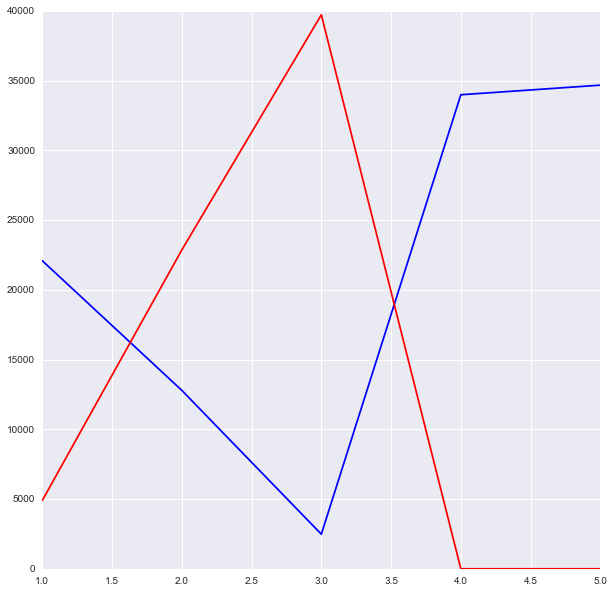

In [59]:
fig = plt.figure(figsize=(10,10))

plt.plot(non_carriers_df['Time Point'], non_carriers_df['Mean HAF Score'], color='Blue')
plt.plot(carriers_df['Time Point'], carriers_df['Mean HAF Score'], color='Red');

ax.set_xlabel('Time', fontdict={'fontsize': 16})
ax.set_ylabel('HAF Score', fontdict={'fontsize': 16});

What you'll notice is that the HAF scores for the carriers keeps increase until the 3rd time point where it decreases. Part of the issue is a bug with MSMS. After fixation all the values for the favorite allele turn to 0's making the HAF scores for the carriers to dip down to almost 0. For the non carriers we see a decrease in HAF scores which is in agreement with the increase for carrier HAF scores. Again the HAF scores for the non carriers is messed up after fixation. 